In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import torch
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

#CNN for Covid Sequence Predictions

In [ ]:

import torch
from torch.autograd import Variable
from torch.nn import Linear, ReLU, CrossEntropyLoss, Sequential,Conv1d, Conv2d,ConvTranspose1d, MaxPool1d, Module, Softmax, BatchNorm2d, Dropout,Sigmoid, Linear
from torch.optim import Adam, SGD

class CovidSequenceCNN(Module):
    
    def __init__(self, n_inputs, numfilters, numdense):
        super(CovidSequenceCNN, self).__init__()
        self.input = Linear(n_inputs, 1)
        self.conv1 = Conv1d(numfilters,)
        self.dropoutpool = Dropout(0.1)
        self.dropoutdense = Dropout(0.1)
        self.maxpool = MaxPool1d()
        self.dense1 = Linear(numdense)
        self.dense2 = Linear(1)
        self.sigmoid = Sigmoid()
        self.relu = ReLU()

    # forward propagate input
    def forward(self, X):
        #Y(X) = sigmoid(Dense(Dense(Pool(Conv(Input(X)))))
        o_input = self.input(X)
        o_conv1 = self.conv1(o_input)
        o_maxpool = self.maxpool(o_conv1)
        o_dropoutpool = self.dropoutpool(o_maxpool)
        o_dense1 = self.dense1(o_dropoutpool)
        o_dropoutdense = self.dropoutdense(self.relu(o_dense1))
        o_dense2 = self.dense2(o_dropoutdense)
        classification = self.sigmoid(o_dense2)
        return classification


  
  


# Autoencoder for finding Latent Representation in Covid Sequences

In [ ]:
class AutoEncoder(torch.nn.Module):
	def __init__(self, input_dims,latent_dims):
		super().__init__()
		self.encoder = torch.nn.Sequential(
			torch.nn.Linear(input_dims, 128),
			torch.nn.ReLU(),
			torch.nn.Linear(128, 128),
			torch.nn.ReLU(),
			torch.nn.Linear(128, latent_dims),
		)
		
		self.decoder = torch.nn.Sequential(
			torch.nn.Linear(latent_dims, 128),
			torch.nn.Sigmoid(),
			torch.nn.Linear(128, 128),
			torch.nn.Sigmoid(),
			torch.nn.Linear(128, input_dims),
			torch.nn.ReLU(),
		)
		def forward(self, x):
			encoded = self.encoder(x)
			decoded = self.decoder(encoded)
			return decoded

In [ ]:
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt

class SequenceDataset(Dataset):
    """Dataset class for viral sequences"""
    def __init__(self, csv_file, root_dir, transform=None):
        self.data_matrix = pd.read_csv(csv_file,index_col="index")
        self.root_dir = root_dir

    def __len__(self):
        return len(self.data_matrix)

    def __getitem__(self, idx):
        forward_path = self.data_matrix.iloc[idx]['forward']
        reverse_path = self.data_matrix.iloc[idx]["reverse"]
        length = self.data_matrix.iloc[idx]["length"]
        
        forward_encoded = torch.tensor(np.load(forward_path).astype(np.float32))
        reverse_encoded = torch.tensor(np.load(reverse_path).astype(np.float32))
      
        sample = {'forward': forward_encoded, 'reverse': reverse_encoded, 'length':length}
        return sample

# Convolutional AutoEncoder

In [ ]:
class ConvolutionalAutoEncoder(torch.nn.Module):
	def __init__(self,latent_dims = 4, num_filters = 128,k = 4):
		super().__init__()
  
		self.encoder = torch.nn.Sequential(
			torch.nn.Conv1d(in_channels=4,out_channels=num_filters,kernel_size=k),
			torch.nn.ReLU(),
			torch.nn.Conv1d(in_channels=num_filters,out_channels=latent_dims,kernel_size=k),
			torch.nn.ReLU(),
			#   torch.nn.MaxPool1d(2),
		)
		
		self.decoder = torch.nn.Sequential(
			torch.nn.ConvTranspose1d(latent_dims, num_filters, k),
			torch.nn.ReLU(),
			torch.nn.ConvTranspose1d(num_filters, 4, k),
					torch.nn.Sigmoid()
		)

	def forward(self, x):
		encoded = self.encoder(x)
		decoded = self.decoder(encoded)
		
		return decoded

	def latent_space(self, x):
		latent_space = self.encoder(x)
		return latent_space



		

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


#testing

main_folder_path="/content/drive/MyDrive/orig/"
# main_folder_path="/content/drive/MyDrive/Georgia Tech/Sophomore/CS 4641/"

forward = torch.tensor(np.load(main_folder_path+"encode/host#MW223134.1#15k_num1_seq1_codefw.npy").astype(np.float32))
print(forward)
forward = np.reshape(forward,newshape=(1,4,15000))
backward = torch.tensor(np.load(main_folder_path+"encode/host#MW223134.1#15k_num1_seq1_codebw.npy").astype(np.float32))
cae_model = ConvolutionalAutoEncoder()
outputs = cae_model.forward(forward)
outputs = np.reshape(outputs.detach().numpy(),newshape=(1,-1,4))
print(outputs)

criterion = torch.nn.MSELoss()
loss = criterion(outputs,forward)

print(loss)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


FileNotFoundError: ignored

# Training Convolutional Autoencoder

### Loading Data/Initializing Parameters

In [ ]:
dataset = SequenceDataset()
epochs = 20
test_idxs, train_idxs = torch.utils.data.random_split(dataset, [0.3 * len(dataset), 0.7 * len(dataset)],generator=torch.Generator().manual_seed(42))
train_dataset = torch.utils.data.Subset(dataset, train_idxs)
test_dataset = torch.utils.data.Subset(dataset, test_idxs)
train_dataloader = torch.utils.data.DataLoader(train_dataset)
test_dataloader = torch.utils.data.DataLoader(test_dataset)
# truth = LOAD GROUND TRUTH # for visualization
device = "cuda" if torch.cuda.is_available() else "cpu"
model = ConvolutionalAutoEncoder().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-2200)

### Training

In [ ]:
scaler = torch.cuda.amp.GradScaler(enabled=True)
def train(model, dataloader,epochs,device):
    iterator = trange(epochs,desc=f'Epoch - {1:10}', leave=True)
    training_loss = 0
    best_model = model
    best_epoch_loss = float('inf')
    for epoch in iterator:
      model.train()
      epoch_loss = 0
      for data in tqdm(dataloader, leave=False):
          forward_input= data['forward']
          reverse_input = data['reverse']
          length  = data['length'].item()
          forward_input = torch.reshape(forward_input,shape=(1,4,length)).to(device)
          reverse_input = torch.reshape(reverse_input,shape=(1,4,length)).to(device)
          optimizer.zero_grad()
          forward_output = model.forward(forward_input)
          criterion = torch.nn.MSELoss()
          loss = criterion(forward_output, forward_input)
          loss.backward()
          epoch_loss += float(loss.item())
          training_loss += float(loss.item())
          optimizer.step()
      if(epoch_loss < best_epoch_loss):
          best_epoch_loss = epoch_loss
          best_model = model
      iterator.set_description(f'Epoch - {epoch+1:10} >> Loss - {training_loss/len(dataloader):10.5f} >> Epoch Loss - {epoch_loss:10.5f}')
      iterator.refresh()
    return best_model

In [ ]:
  train(model, train_dataloader, epochs, device)

# PCA on Latent Embeddings

In [ ]:

PATH = main_folder_path+"models/model1st.pth"

model = ConvolutionalAutoEncoder()
model.load_state_dict(torch.load(PATH))
model.eval()

FileNotFoundError: ignored

### Loading in Latent Embeddings

In [ ]:


from sklearn.preprocessing import StandardScaler

latent_spaces_covid = np.load(main_folder_path+'latent spaces/all_encodings.npy')
latent_spaces_covid = np.squeeze(latent_spaces_covid.transpose(0,2,1))
latent_spaces_covid = latent_spaces_covid.reshape(43548,-1)

# latent_spaces_covid = np.load(main_folder_path+'latent spaces/latent_space.npy')
files = np.load(main_folder_path+'latent spaces/files.npy')
types = np.load(main_folder_path+'latent spaces/species.npy')
# omicron_latent_space = np.load(main_folder_path+'latent spaces/omricon_latent_space-1.npy')


omicron_latent_space = np.load(main_folder_path+'latent spaces/all_encodings_omicron.npy')
omicron_latent_space = np.squeeze(omicron_latent_space.transpose(0,2,1))

# print(latent_spaces_covid)
print(latent_spaces_covid.shape)
latent_dims = latent_spaces_covid.shape[1]
feature_columns = [f'Feature {x}' for x in range(1,latent_dims+1)]

# colors_covid = colors
og_df = pd.DataFrame(data=latent_spaces_covid, columns=feature_columns)
og_df['SARS-CoV-2 Type'] = types
og_df['Filename'] = files


og_df_omicron = pd.DataFrame(data=omicron_latent_space, columns=feature_columns)
og_df_omicron['SARS-CoV-2 Type'] = 'omicron'

og_df = og_df.append(og_df_omicron, ignore_index=True)

colors = np.concatenate(([0]*len(og_df[og_df['SARS-CoV-2 Type'] == 'alpha']), [1]*len(og_df[og_df['SARS-CoV-2 Type'] == 'delta']),[2]*len(og_df[og_df['SARS-CoV-2 Type'] == 'omicron'])))

features = og_df.loc[:, feature_columns].values
features = StandardScaler().fit_transform(features)
types = og_df.loc[:,['SARS-CoV-2 Type']].values
# og_df[og_df['SARS-CoV-2 Type'] == 'delta']
og_df




(43548, 136)


,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17,Feature 18,Feature 19,Feature 20,Feature 21,Feature 22,Feature 23,Feature 24,Feature 25,Feature 26,Feature 27,Feature 28,Feature 29,Feature 30,Feature 31,Feature 32,Feature 33,Feature 34,Feature 35,Feature 36,Feature 37,Feature 38,Feature 39,Feature 40,...,Feature 99,Feature 100,Feature 101,Feature 102,Feature 103,Feature 104,Feature 105,Feature 106,Feature 107,Feature 108,Feature 109,Feature 110,Feature 111,Feature 112,Feature 113,Feature 114,Feature 115,Feature 116,Feature 117,Feature 118,Feature 119,Feature 120,Feature 121,Feature 122,Feature 123,Feature 124,Feature 125,Feature 126,Feature 127,Feature 128,Feature 129,Feature 130,Feature 131,Feature 132,Feature 133,Feature 134,Feature 135,Feature 136,SARS-CoV-2 Type,Filename
0,0.010146,0.000370,0.001109,0.003931,0.000773,0.000907,0.005946,0.006585,0.009104,0.005006,0.007895,0.004031,0.008768,0.003360,0.008500,0.009608,0.013203,0.003460,0.004569,0.010381,0.005879,0.001713,0.004871,0.004737,0.007492,0.007391,0.003729,0.001008,0.002587,0.013606,0.011960,0.001243,0.002452,0.007895,0.013371,0.009172,0.001613,0.008735,0.006484,0.009239,...,0.014076,0.002016,0.019284,0.005274,0.010986,0.000706,0.013203,0.001512,0.001982,0.008668,0.010515,0.012363,0.009071,0.012598,0.002654,0.005980,0.013673,0.010751,0.011590,0.009575,0.014648,0.007828,0.012262,0.005510,0.010482,0.005846,0.014110,0.010011,0.011389,0.006249,0.010751,0.006383,0.005577,0.002788,0.005409,0.004334,0.007727,0.001075,delta,EPI_ISL_1454606
1,0.010258,0.000370,0.001143,0.003969,0.000774,0.000908,0.006020,0.006558,0.009047,0.005078,0.007870,0.004069,0.008778,0.003363,0.008509,0.009652,0.013251,0.003464,0.004608,0.010459,0.005886,0.001682,0.004843,0.004708,0.007466,0.007365,0.003767,0.001043,0.002623,0.013554,0.011939,0.001244,0.002489,0.007937,0.013453,0.009081,0.001547,0.008744,0.006457,0.009181,...,0.014058,0.002052,0.019372,0.005280,0.010930,0.000740,0.013184,0.001480,0.002052,0.008576,0.010459,0.012309,0.009114,0.012612,0.002691,0.005986,0.013722,0.010762,0.011536,0.009585,0.014529,0.007903,0.012276,0.005516,0.010493,0.005785,0.014024,0.010022,0.011435,0.006323,0.010796,0.006390,0.005549,0.002791,0.005347,0.004406,0.007735,0.001110,delta,EPI_ISL_1470937
2,0.010223,0.000370,0.001143,0.003968,0.000773,0.000908,0.006020,0.006591,0.009046,0.005078,0.007869,0.004036,0.008777,0.003397,0.008508,0.009652,0.013250,0.003464,0.004607,0.010459,0.005851,0.001681,0.004843,0.004708,0.007499,0.007365,0.003766,0.001043,0.002589,0.013553,0.011938,0.001244,0.002489,0.007937,0.013452,0.009080,0.001547,0.008744,0.006457,0.009181,...,0.014057,0.002051,0.019370,0.005280,0.010930,0.000740,0.013183,0.001480,0.002051,0.008609,0.010425,0.012308,0.009114,0.012611,0.002690,0.005986,0.013721,0.010761,0.011568,0.009584,0.014561,0.007869,0.012275,0.005515,0.010492,0.005784,0.014023,0.010022,0.011434,0.006322,0.010795,0.006390,0.005549,0.002791,0.005347,0.004405,0.007735,0.001110,delta,EPI_ISL_1470959
3,0.010213,0.000370,0.001109,0.003964,0.000773,0.000907,0.006014,0.006518,0.009104,0.005039,0.007895,0.004031,0.008768,0.003360,0.008500,0.009642,0.013237,0.003460,0.004636,0.010448,0.005812,0.001713,0.004838,0.004771,0.007425,0.007324,0.003763,0.001008,0.002587,0.013573,0.011926,0.001243,0.002452,0.007962,0.013438,0.009104,0.001579,0.008768,0.006518,0.009205,...,0.014076,0.002016,0.019317,0.005207,0.010918,0.000706,0.013169,0.001512,0.002016,0.008668,0.010549,0.012330,0.009138,0.012632,0.002587,0.006014,0.013707,0.010818,0.011557,0.009575,0.014648,0.007828,0.012262,0.005510,0.010448,0.005846,0.014110,0.009978,0.011456,0.006282,0.010818,0.006383,0.005543,0.002788,0.005375,0.004435,0.007727,0.001075,delta,EPI_ISL_1473648
4,0.010325,0.000337,0.001147,0.003982,0.000776,0.000945,0.006006,0.006580,0.008942,0.005095,0.007896,0.004049,0.008773,0.003408,0.008435,0.009684,0.013092,0.003509,

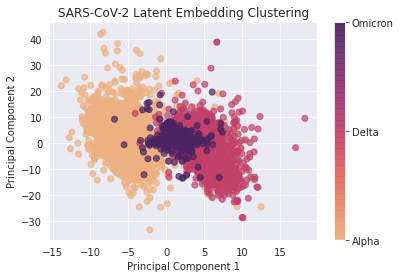

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
import seaborn as sns
from matplotlib import pyplot as plt
# OG_DF = pd.DataFrame(data = [alpha_pred,beta_pred,gamma_pred,other_pred]
#              , columns = ['Alpha', 'Beta', 'Gamma', 'Other'])

sns.set_style("darkgrid")

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(features)
PCA_df = pd.DataFrame(data = principalComponents
             , columns = ['Principal Component 1', 'Principal Component 2'])


PCA_df_types = pd.concat([PCA_df, og_df[['SARS-CoV-2 Type']]], axis = 1)
PCA_df_colors = pd.concat([PCA_df, pd.DataFrame(colors, columns=['Color'])], axis = 1)

PCA_df_colors

plt.scatter(PCA_df_types["Principal Component 1"], PCA_df_types["Principal Component 2"],c=PCA_df_colors["Color"],alpha=0.7,cmap="flare",)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('SARS-CoV-2 Latent Embedding Clustering')
cb = plt.colorbar(ticks=[0, 1, 2]);
labels = cb.ax.set_yticklabels(['Alpha', 'Delta', 'Omicron'])



In [ ]:
# !pip uninstall umap
!pip install umap-learn
import umap.umap_ as umap

reducer = umap.UMAP()


embedding = reducer.fit_transform(features)
embedding.shape

plt.scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=PCA_df_colors["Color"],
    alpha=0.7,cmap="flare")
cb = plt.colorbar(ticks=[0, 1, 2]);
labels = cb.ax.set_yticklabels(['Alpha', 'Delta', 'Omicron'])
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of SARS-CoV-2 Latent Embeddings', fontsize=24)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning:

The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.

/usr/local/lib/python3.7/dist-packages/umap/spectral.py:261: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

/usr/local/lib/python3.7/dist-packages/umap/spectral.py:261: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

/usr/local/lib/python3.7/dist-packages/umap/spectral.py:261: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!

/usr/local/lib/python3.7/dist-packages/umap/spectral.py:261: UserWarning:

failed

KeyboardInterrupt: ignored

### PCA 3 components

In [ ]:
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(features)
PCA_df = pd.DataFrame(data = principalComponents
             , columns = ['Principal Component 1', 'Principal Component 2','Principal Component 3'])


PCA_df_types = pd.concat([PCA_df, og_df[['SARS-CoV-2 Type']]], axis = 1)
PCA_df_colors = pd.concat([PCA_df, pd.DataFrame(colors, columns=['Color'])], axis = 1)

PCA_df_colors

,Principal Component 1,Principal Component 2,Principal Component 3,Color
0,-5.764578,-2.892589,-1.461366,0
1,-4.876813,-0.243231,-0.343379,0
2,-4.329423,0.041812,-0.199804,0
3,-6.069514,-1.711670,1.371343,0
4,-4.484136,1.371547,-0.382795,0
...,...,...,...,...
44187,1.982760,1.574814,-2.864204,2
44188,2.379603,0.262569,-4.264182,2
44189,1.373983,2.336724,-4.850726,2
44190,0.480528,0.019322,-0.150903,2


In [ ]:

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))
configure_plotly_browser_state()

import plotly
import plotly.graph_objs as go
pal = sns.color_palette("flare")
print(pal.as_hex())
# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()
colordict = {0:'#e98d6b',1:'#d14a61',2:'#6c2b6d'}

# Configure the trace.
alpha = PCA_df_colors[PCA_df_colors.Color==0]
t1 = go.Scatter3d(
    x=alpha["Principal Component 1"],  # <-- Put your data instead
    y=alpha["Principal Component 2"],  # <-- Put your data instead
    z=alpha["Principal Component 3"],  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 3,
        'opacity': 0.5,
        'color': colordict[0],
    },
    name="Alpha"
)
delta = PCA_df_colors[PCA_df_colors.Color==1]
t2 = go.Scatter3d(
    x=delta["Principal Component 1"],  # <-- Put your data instead
    y=delta["Principal Component 2"],  # <-- Put your data instead
    z=delta["Principal Component 3"],  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 3,
        'opacity': 0.5,
        'color': colordict[1],
    },
    name="Delta"
)

omicron = PCA_df_colors[PCA_df_colors.Color==2]
t3 = go.Scatter3d(
    x=omicron["Principal Component 1"],  # <-- Put your data instead
    y=omicron["Principal Component 2"],  # <-- Put your data instead
    z=omicron["Principal Component 3"],  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 3,
        'opacity': 0.5,
        'color': colordict[2],
    },
    name="Omicron"
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [t1,t2,t3]
plot_figure = go.Figure(data=data, layout=layout)

plot_figure.update_layout(scene = dict(
                    xaxis_title='Principal Component 1',
                    yaxis_title='Principal Component 2',
                    zaxis_title='Principal Component 3'))


# Render the plot.
plotly.offline.iplot(plot_figure)

['#e98d6b', '#e3685c', '#d14a61', '#b13c6c', '#8f3371', '#6c2b6d']


# LightGBM Classifer

In [ ]:
# !pip install lightgbm

import lightgbm as lgb
from sklearn.model_selection import train_test_split

X_train, X_validate, y_train, y_validate = train_test_split(features, colors, 
                                                    test_size=0.3, 
                                                    random_state=42) 
train_data = lgb.Dataset(X_train,y_train)
validate_data = lgb.Dataset(X_validate,y_validate)
classifier = lgb.LGBMClassifier()
classifier.fit(X_train, y_train)

In [ ]:
y_pred = classifier.predict(X_validate)
from sklearn.metrics import accuracy_score
print('LightGBM Model Overall validation accuracy score: {0:0.4f}'.format(accuracy_score(y_validate, y_pred)))
val_alpha_accuracy = sum(classifier.predict(X_validate[y_validate==0]) == y_validate[y_validate==0]) / len(X_validate[y_validate==0])
val_delta_accuracy = sum(classifier.predict(X_validate[y_validate==1]) == y_validate[y_validate==1]) / len(X_validate[y_validate==1])

val_omicron_accuracy = sum(classifier.predict(X_validate[y_validate==2]) == y_validate[y_validate==2]) / len(X_validate[y_validate==2])

print(len(X_train[y_train==0]),len(X_train[y_train==1]),len(X_train[y_train==2]))
print(len(X_train)-452)
print('LightGBM Model Alpha validation accuracy score: {0:0.4f}'.format(val_alpha_accuracy))
print('LightGBM Model Delta validation accuracy score: {0:0.4f}'.format(val_delta_accuracy))
print('LightGBM Model Omicron validation accuracy score: {0:0.4f}'.format(val_omicron_accuracy))


In [ ]:


from sklearn.preprocessing import StandardScaler

latent_spaces_covid = np.load(main_folder_path+'latent spaces/latent_space.npy')
files = np.load(main_folder_path+'latent spaces/files.npy')
types = np.load(main_folder_path+'latent spaces/species.npy')
omicron_latent_space = np.load(main_folder_path+'latent spaces/omricon_latent_space-1.npy')
print(latent_spaces_covid.shape)
latent_dims = len(latent_spaces_covid)
feature_columns = [f'Feature {x}' for x in range(1,latent_dims+1)]

# colors_covid = colors
og_df = pd.DataFrame(data=latent_spaces_covid, columns=feature_columns)
og_df['SARS-CoV-2 Type'] = types
og_df['Filename'] = files


og_df_omicron = pd.DataFrame(data=omicron_latent_space, columns=feature_columns)
og_df_omicron['SARS-CoV-2 Type'] = 'omicron'

og_df = og_df.append(og_df_omicron, ignore_index=True)

colors = np.concatenate(([0]*len(og_df[og_df['SARS-CoV-2 Type'] == 'alpha']), [1]*len(og_df[og_df['SARS-CoV-2 Type'] == 'delta']),[2]*len(og_df[og_df['SARS-CoV-2 Type'] == 'omicron'])))

features = og_df.loc[:, feature_columns].values
features = StandardScaler().fit_transform(features)
types = og_df.loc[:,['SARS-CoV-2 Type']].values
# og_df[og_df['SARS-CoV-2 Type'] == 'delta']
og_df


